### Import Modules

In [1]:
import pandas as pd
import pandas_profiling
import numpy as np

from functools import partial
from itertools import combinations

from typing import Union, Callable

import optuna
from sklearn import tree
from sklearn import metrics
from sklearn import manifold
from sklearn import model_selection
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

import graphviz
import seaborn as sns
import matplotlib.pyplot as plt

### Read Dataset

In [2]:
df = pd.read_csv('datasets/mobile-price.csv')
df

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


### EDA

#### Correlation

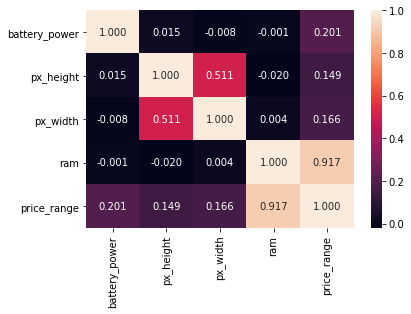

In [3]:
correlation = df.corr()

mask = np.abs(correlation['price_range']) > 0.05
corr_features = correlation.columns[mask]

sns.heatmap(
    data=df[corr_features].corr(),
    annot=True, fmt='.3f'
)
plt.show()

In [4]:
pandas_profiling.ProfileReport(df, explorative=True, dark_mode=True)

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Train-Test Split

In [5]:
train, test = model_selection.train_test_split(
    df, test_size=0.2,
    random_state=42,
    shuffle=True,
    stratify=df.price_range
)

### Split Inputs and Targets

In [6]:
def inputs_targets(df: pd.DataFrame, targets: str):
    inputs = df.drop(targets, axis=1)
    targets = df[targets]
    return inputs, targets

In [7]:
x_train, y_train = inputs_targets(train, 'price_range')
x_test, y_test = inputs_targets(test, 'price_range')

### Select Important Features

In [8]:
n_features = 6

In [9]:
select = SelectKBest(score_func=chi2, k=n_features)
best = select.fit(x_train, y_train)

scores = pd.DataFrame({
    'feature': x_train.columns,
    'scores': best.scores_
})
scores.sort_values(by='scores', ascending=False, inplace=True)
scores.reset_index(drop=True)

,feature,scores
0,ram,746705.597672
1,battery_power,11426.730400
2,px_height,10696.796135
3,px_width,7557.945611
4,mobile_wt,76.459556
5,int_memory,74.728582
6,talk_time,13.220327
7,sc_w,12.845771
8,pc,11.165960
9,n_cores,10.143643


In [10]:
x_train_best = best.transform(x_train)
x_test_best = best.transform(x_test)

In [11]:
class_names = ['low', 'medium', 'high', 'very high']
feature_names = scores.feature[:n_features].values

### Visualize Data

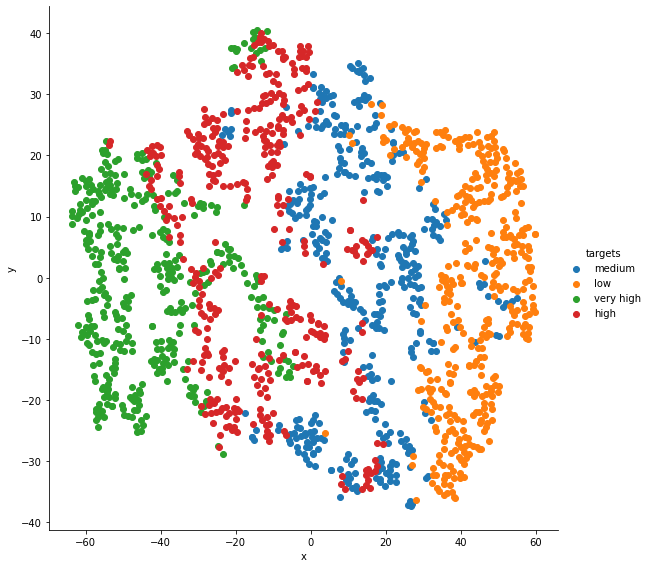

In [12]:
tsne = manifold.TSNE(
    n_components=2, random_state=42, n_jobs=-1
)
tsne_df = pd.DataFrame(
    np.column_stack((
        tsne.fit_transform(x_train_best), 
        y_train.astype('category').cat.rename_categories(class_names)
    )),
    columns=['x', 'y', 'targets']
)
grid = sns.FacetGrid(
    data=tsne_df, hue='targets', height=8
)
grid.map(plt.scatter, 'x', 'y').add_legend()

### Optimize

In [13]:
def optimize(trial: optuna.Trial, setup_model: Callable, x: pd.DataFrame, y: pd.Series, kfolds: int):
    model, accuracies = setup_model(trial), []
    
    kf = model_selection.StratifiedKFold(n_splits=kfolds)
    for (train, valid) in kf.split(X=x, y=y):
        
        x_train, y_train = x[train], y[train]
        x_valid, y_valid = x[valid], y[valid]
        
        model.fit(x_train, y_train)
        preds = model.predict(x_valid)
        
        accuracy = metrics.accuracy_score(y_valid, preds)
        accuracies.append(accuracy)
        
    return np.mean(accuracies)

### Compute Best Parameters

#### Decision Tree (CART)

In [14]:
def decision_tree(trial: optuna.Trial):
    max_depth = trial.suggest_int(
        name='max_depth',
        low=4, high=16
    )
    min_samples_leaf = trial.suggest_int(
        name='min_samples_leaf',
        low=2, high=8
    )
    model = tree.DecisionTreeClassifier(
        criterion='entropy',
        max_depth=max_depth,
        min_samples_leaf=min_samples_leaf,
    )
    return model

In [15]:
study = optuna.create_study(
    study_name='decision-tree',
    direction='maximize'
)
objective = partial(
    optimize,
    setup_model=decision_tree,
    x=x_train_best, 
    y=y_train.values,
    kfolds=5
)
study.optimize(
    func=objective,
    n_trials=25,
    n_jobs=-1,
    show_progress_bar=False,
)

[I 2021-04-14 20:31:04,163] A new study created in memory with name: decision-tree
[I 2021-04-14 20:31:04,245] Trial 6 finished with value: 0.813125 and parameters: {'max_depth': 5, 'min_samples_leaf': 4}. Best is trial 6 with value: 0.813125.
[I 2021-04-14 20:31:04,248] Trial 4 finished with value: 0.845 and parameters: {'max_depth': 11, 'min_samples_leaf': 8}. Best is trial 4 with value: 0.845.
[I 2021-04-14 20:31:04,253] Trial 1 finished with value: 0.8287500000000001 and parameters: {'max_depth': 6, 'min_samples_leaf': 5}. Best is trial 4 with value: 0.845.
[I 2021-04-14 20:31:04,256] Trial 2 finished with value: 0.8487500000000001 and parameters: {'max_depth': 8, 'min_samples_leaf': 3}. Best is trial 2 with value: 0.8487500000000001.
[I 2021-04-14 20:31:04,261] Trial 7 finished with value: 0.8418749999999999 and parameters: {'max_depth': 7, 'min_samples_leaf': 8}. Best is trial 2 with value: 0.8487500000000001.
[I 2021-04-14 20:31:04,263] Trial 8 finished with value: 0.84875000000

#### Best Decision Tree Classifier

              precision    recall  f1-score   support

         low       0.93      0.96      0.95       100
      medium       0.86      0.82      0.84       100
        high       0.83      0.85      0.84       100
   very high       0.94      0.93      0.93       100

    accuracy                           0.89       400
   macro avg       0.89      0.89      0.89       400
weighted avg       0.89      0.89      0.89       400



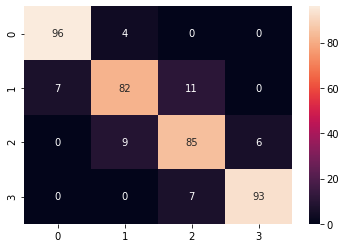

In [16]:
params = study.best_params
classifier = tree.DecisionTreeClassifier(
    criterion='entropy', **params,
)
classifier.fit(
    X=x_train_best, 
    y=y_train
)
predictions = classifier.predict(
    x_test_best
)
matrix = metrics.confusion_matrix(
    y_true=y_test,
    y_pred=predictions
)
sns.heatmap(data=matrix, annot=True)

report = metrics.classification_report(
    y_true=y_test,
    y_pred=predictions,
    target_names=class_names,
)
print(report)

In [17]:
x_test['predictions'] = predictions
x_test

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,predictions
501,1773,1,2.5,0,16,1,32,0.6,170,6,...,1215,1472,3566,17,6,13,1,0,1,3
1924,1982,1,1.6,0,2,1,12,0.2,80,5,...,287,593,1824,13,3,14,1,1,1,1
1710,548,0,1.0,1,0,1,56,0.4,146,4,...,657,1657,562,17,14,8,1,1,1,0
547,1117,1,0.6,1,0,0,31,0.2,146,2,...,1258,1627,2003,8,7,14,0,1,1,2
496,1554,1,0.5,1,11,0,5,1.0,124,3,...,395,1579,3635,7,4,18,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1204,1524,0,2.5,1,11,1,41,1.0,96,4,...,184,740,1936,7,0,9,1,1,1,1
1937,1396,1,0.6,0,0,0,37,0.7,134,4,...,560,1177,2694,18,3,19,0,0,1,2
412,1478,1,0.8,1,12,0,48,0.7,99,5,...,694,882,1141,5,2,6,0,0,1,0
243,1918,0,1.9,0,2,0,10,0.6,110,5,...,1170,1543,1717,7,1,16,1,1,1,2


### Plot Boundary

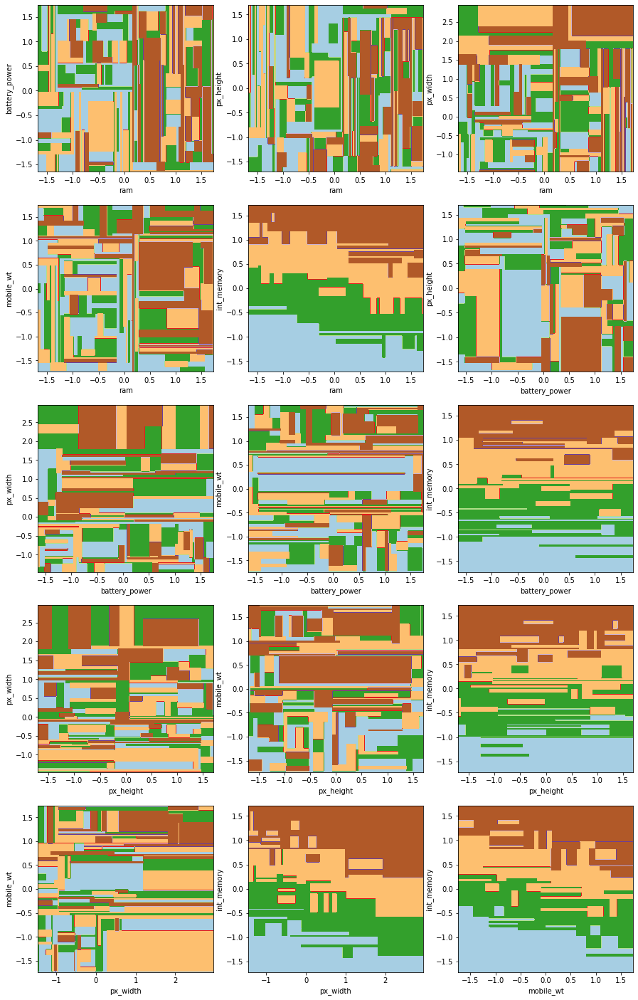

In [18]:
idxs = range(n_features)

plt.figure(figsize=(15, 25))
for pairidx, pair in enumerate(combinations(idxs, 2)):
    
    x = x_train_best[:, pair]
    y = y_train
    X = (x - x.mean(axis=0)) / x.std(axis=0)
    
    cart = tree.DecisionTreeClassifier(
        criterion='entropy', **params
    ).fit(X, y)
    plt.subplot(5, 3, pairidx + 1)
    
    xx, yy = np.meshgrid(
        np.arange(
            start=X[:, 0].min(),
            stop=X[:, 0].max(),
            step=0.01
        ),
        np.arange(
            start=X[:, 1].min(),
            stop=X[:, 1].max(),
            step=0.01
        ),
    )
    preds = cart.predict(
        np.array([xx.ravel(), yy.ravel()]).T
    )
    preds = preds.reshape(xx.shape)
    plt.contourf(xx, yy, preds, cmap=plt.cm.Paired)
    
    plt.xlabel(feature_names[pair[0]])
    plt.ylabel(feature_names[pair[1]])

plt.show()

#### Plot Tree

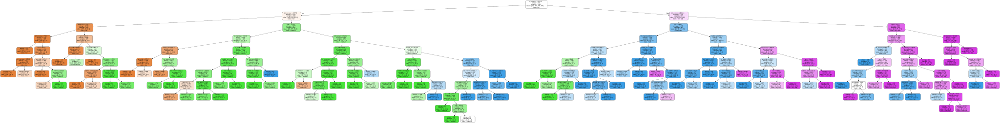

In [19]:
data = tree.export_graphviz(
    classifier, out_file=None,
    class_names=class_names,
    feature_names=feature_names,
    filled=True,
    rounded=True,
    special_characters=True
)
graph = graphviz.Source(data)
graph